# Vision Project

## Goal

Create a generative image application for graphical mods for video games.

## Model Flowchart

Take game images to be modded -> BLIP to generate text that would create the input image -> Style modifier for the text to include the style that you want i.e. anime/GTA style/Realistic/etc -> Image generation -> Generate for a list of images

## Current goal

Implement pulling from local cache.
Implement CPU, CUDA, mps. Make sure to mention I cannot verify mps works.

In [1]:
import os

# BLIP imports
from PIL import Image
import requests
from transformers import AutoProcessor, BlipForConditionalGeneration
import re


# Image Generation pipeline
from diffusers import AutoPipelineForText2Image
from diffusers import StableDiffusionPipeline
import torch

### Input image

Below is the image I primarily used to test the various models.

In [23]:
filename = './bg-kuster_cow-001.jpg'

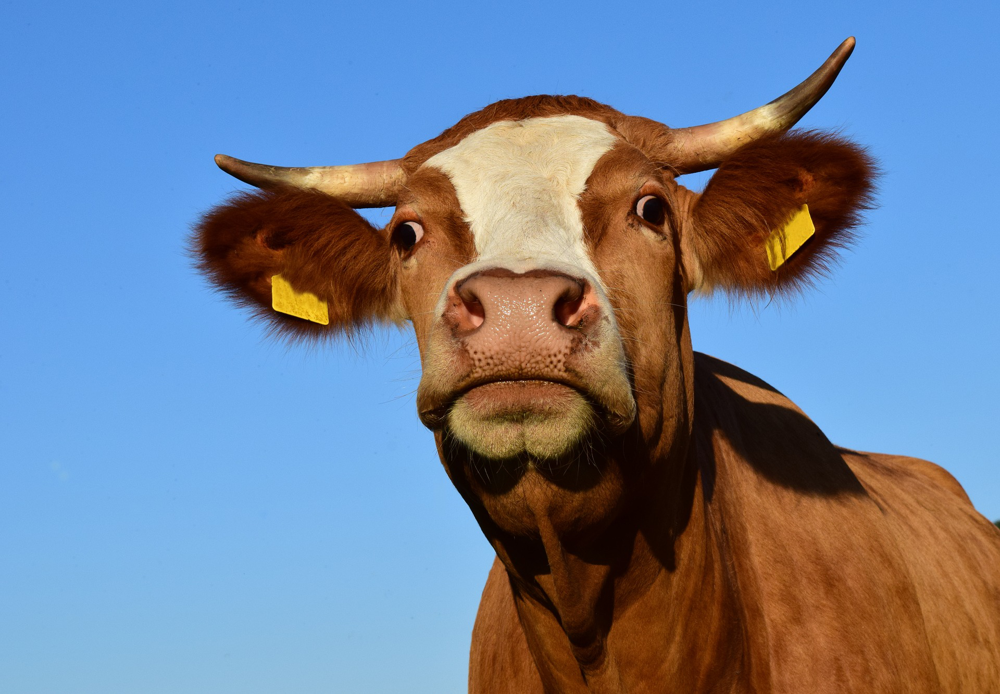

In [24]:
image = Image.open(filename)
image

### BLIP

This will take an image and generate the text that would recreate it.

In [2]:
def prompt_generator(filename, max_length=50, predownloaded=False):
    '''
    Uses BLIP to autogenerate a prompt for an image.
    '''

    if predownloaded == False:
        processor = AutoProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
        model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
    elif predownloaded == True:
        processor = AutoProcessor.from_pretrained('./models/blip-image-captioning-base')
        model = BlipForConditionalGeneration.from_pretrained('./models/blip-image-captioning-base')
        
    image = Image.open(filename)
    text = "A picture of"

    inputs = processor(images=image, text=text, return_tensors="pt")
    pixel_values = inputs.pixel_values

    generated_ids = model.generate(pixel_values=pixel_values, max_length=max_length)
    generated_prompt = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

    return generated_prompt

In [32]:
prompt = prompt_generator('./bg-kuster_cow-001.jpg', predownloaded=True)
print(prompt)

a brown cow with a yellow tag on its ear


### Modify Text

Using the preferred style, we obtain 3 variables for each prompt.

The style_model variable is the huggingface model that will be used to generate an image, the model_type variable tells later functions how to handle the downloaded model, and the style_prompt variable that adjusts the prompt to be in line with the requirements for the model.

We also allow for input manual if our preconfigured models are insufficient.

In [3]:
def style_token(generated_prompt, style='', predownloaded=False):
    '''
    This function takes the generated prompt and returns 3 variables.
    style_model tells the image generator what model to use to generate a new image
    model_type is used by the image generator for handling different models according to how they need to be called.
    style_prompt append the appropriate language to the original prompt
    '''

    if style == 'manual':
        if predownloaded == False:
            style_model = input('Enter the style model you want loaded: ')
        elif predownloaded == True:
            style_model = input('Enter the path to the model you wish to use: ')
            
        model_type = input('Input model_type per style_token function description: ')
        style_prompt = input('Enter the appropriate modification to the prompt: ')
        
    elif style == 'gta5':
        if predownloaded == False:
            style_model = 'sd-concepts-library/gta5-artwork'
        elif predownloaded == True:
            style_model = './models/gta5-artwork'
            
        model_type = 'token'
        style_prompt = '<gta5-artwork> style '
        
    elif style == 'ghibli':
        if predownloaded == False:
            style_model = 'nitrosocke/Ghibli-Diffusion'
        elif predownloaded == True:
            style_model = './models/Ghibli-Diffusion'
            print('style_model predown = True')
        model_type = 'model'
        style_prompt = 'ghibli style '
        
    elif style == 'anime':
        if predownloaded == False:
            style_model = 'cagliostrolab/animagine-xl-3.1'
        elif predownloaded == True:
            style_model = './models/animagine-xl-3.1'
            
        model_type = 'adv_model'
        print('cagliostrolab\'s animagine-xL-3.1 is a more advanced model, as such it requires more specific prompting.')
        print('For the prompt use the following format: 1girl/1boy, character name, from what series, everything else in any order.')
        style_prompt = input('Your input: ')
    
    elif style == 'anime2':
        if predownloaded == False:
            style_model = 'hakurei/waifu-diffusion'
        elif predownloaded == True:
            style_model = './models/waifu-diffusion'
            
        model_type = 'adv_model'
        print(generated_prompt)
        print('Manually convert your initial prompt into booru tags.')
        print('A full list can be found at Danbooru or other boorus. NSFW Warning')
        print('Use your own discretion visiting this website. https://danbooru.donmai.us/')
        print('Initial prompt: ', generated_prompt)
        style_prompt = input(' Your input: ')
    
    elif style == 'realism':
        if predownloaded == False:
            style_model = 'emilianJR/epiCRealism'
        elif predownloaded == True:
            style_model = './models/epiCRealism'
            
        model_type = 'model'
        style_prompt = ''

    
    else:
        pass

    return style_model, model_type, style_prompt

### Image Generation

In [4]:
def image_generator(filename,  style='', num_inference_steps=25, autogen_prompt=True, max_length=50,
                    keep_model=True, predownloaded=False, processor_type='cpu', **kwargs):

    '''
    The image generator sets up and generates the image in the style you desire.
    '''
    #Probably need a separate manual category.
    
    # Creates prompt through autogeneration of prompt or direct input
    if autogen_prompt == True:
        prompt = prompt_generator(filename, max_length=max_length, predownloaded=predownloaded)
    elif autogen_prompt == False:
        prompt = input('Input your basic prompt: ')

    # Auto appends for model_types token and model but skips for adv models to
    # allow for more complex prompting later.
    if style != '':
        style_model, model_type, style_prompt = style_token(prompt, style=style, predownloaded=predownloaded)
        if model_type != 'adv_model':
            prompt = style_prompt + prompt

    # This lets me append tokens to a base model
    if model_type == 'token':
        if predownloaded == False:
            pipeline = AutoPipelineForText2Image.from_pretrained(
                        "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float32, use_safetensors=True
                        ).to(processor_type)
        elif predownloaded == True:
            pipeline = AutoPipelineForText2Image.from_pretrained(
                        "./models/stable-diffusion-v1-5", torch_dtype=torch.float32, use_safetensors=True
                        ).to(processor_type)
        pipeline.load_textual_inversion(style_model)
    # this lets me call specific stabel diffusion forks
    elif model_type == 'model':
        pipeline = AutoPipelineForText2Image.from_pretrained(
                    style_model, torch_dtype=torch.float32, use_safetensors=True
                    ).to(processor_type)
    # This is for models that require more advanced prompting or other modifications
    elif model_type == 'adv_model': # idea is for complicated models use this to pass prompts.
        # perhaps I should call the pipeline in the style_token func and have you input them per the model
        if style == 'anime':
            pipeline = AutoPipelineForText2Image.from_pretrained(
                        style_model, torch_dtype=torch.float32, use_safetensors=True
                        ).to(processor_type)
            append_loc = input('Append front or back of original prompt with f or b: ')
            if append_loc == 'f':
                prompt = style_prompt + ', '+ prompt
            elif append_loc == 'b':
                prompt += ', ' + style_prompt
            else:
                return print('Error: you need to input \'f\' or \'b\'')

        elif style == 'anime2':
            pipeline = AutoPipelineForText2Image.from_pretrained(
                        style_model, torch_dtype=torch.float32, use_safetensors=True
                        ).to(processor_type)
            prompt = style_prompt

                
                

    # Models can take up a lot of space, use keep_model false if you don't intend to reuse it.
    if keep_model == False:
        # use regex to cut up style_model into token1 and token2 off of the /
        # Also test elsewhere to make sure I dont delete something vital
        #shutil.rmtree('C:/Users/dblan/.cache/huggingface/hub/models--' + token1 + '--' + token2)
        pass
    return pipeline(prompt, num_inference_steps=num_inference_steps, **kwargs).images[0]

### Call Function

In [35]:
def generate_graphic_mods(filepath, save_folder='./mods', style='', num_inference_steps=25, max_length=50, 
                          autogen_prompt=True, keep_model=True, predownloaded=True, full_auto=False,
                          processor_type='cpu', **kwargs):
    '''
    This function calls all the functions on a directory of images  allowing you to create a whole
    set of images to replace the old ones. It is HIGHLY recommended you have all the models you will use
    predownloaded otherwise connection issues can cause the function to fail early.
    
    
    '''
    
    
    # Obtain filenames for images to be modded.
    image_names = os.listdir(filepath)
    
    # Generate modded images for each original image.
    image_list = []
    for img in image_names:
        image_list.append(image_generator(filename=filepath + img, style=style, num_inference_steps=num_inference_steps,
                                          max_length=max_length, autogen_prompt=autogen_prompt,
                                          keep_model=keep_model, predownloaded=predownloaded, **kwargs))

    # Satisfaction check for each image followed by regenerating unsatisfacotry images until satisfied.
    # Default is set to skip this.
    if full_auto == False:
        satisfaction_list = []
        while sum(satisfaction_list) < len(satisfaction_list):
            for img in image_list:
                img
                satisfaction_check = input('Are you satisfied with this image? y/n: ')
                if satisfaction_check == 'y':
                    satisfaction_list.append(1)
                elif satisfaction_check == 'n':
                    satisfaction_list.append(0)
            #insert redo of specific indices
            redo_indices = [index for index, value in enumerate(satisfaction_list) if value == 0]
            if redo_indices != []:
                for idx in redo_indices:
                    image_list[idx] = image_generator(style=style, num_inference_steps=num_inference_steps,
                                                      max_length=max_length, autogen_prompt=autogen_prompt,
                                                      keep_model=keep_model, predownloaded=predownloaded,
                                                      processor_type='cpu', **kwargs)


    # Attempting to autocreate folder for mods and save them in the folder.
    # Currently unimplemented as I am trying to better understand how to implement
    # this and the save function below.
    
    #os.mkdir(save_folder)
    
    # alternatively need to change dir to where i save the stuff and just save in there

    
    # Saves each image with original filename and _'style'
    # Goal to implement saving in a different directory.
    for idx in range(len(image_list)):
        image_list[idx].save(style + '_' + image_names[idx])
                    
  # Figure out if we can resize images using this without messing up the image.
#         img  = Image.new(
#         mode = "RGB",
#         size = (400, 300),
#         color = (255, 0, 0))

# Save the image
    return image_list

### Testing Various Models

Below I test various models using the image_generator function.

#### GTA 5

Below we see the GTA5 token appended to the stable diffusion model. We can very clearly see that the cow image seems to have morphed into the dog and the rest probably autogenerated from the token. Of note, the large number of inference steps may have essentially caused an overfitting of this image.

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

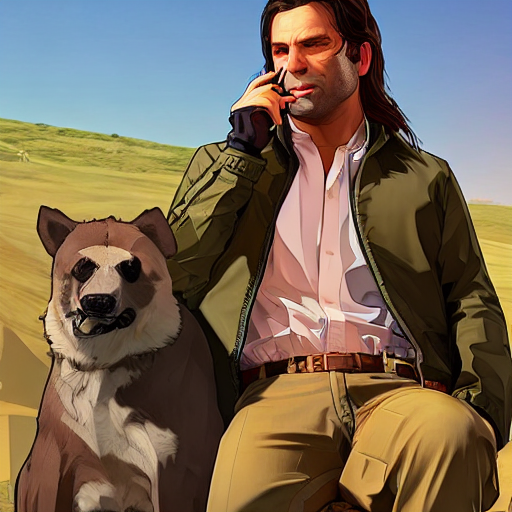

In [29]:
test = image_generator(prompt_generator('./bg-kuster_cow-001.jpg'), style='gta5', num_inference_steps=200)
test

#### Ghibli Style

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

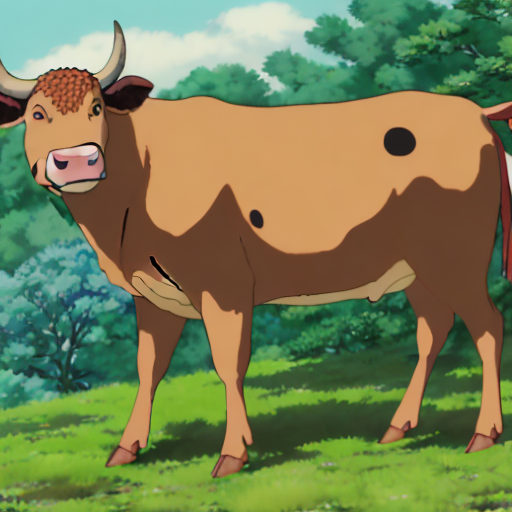

In [12]:
ghibli_test = image_generator('./bg-kuster_cow-001.jpg',  style='ghibli', num_inference_steps=30,
                              max_length=50, predownloaded=True)
ghibli_test

#### Anime Style

In [25]:
neg_prompt = "nsfw, lowres, (bad), text, error, fewer, extra, missing, worst quality, jpeg artifacts, low quality, watermark, unfinished, displeasing, oldest, early, chromatic aberration, signature, extra digits, artistic error, username, scan, [abstract]"

test_adv_model = image_generator('./bg-kuster_cow-001.jpg', style='anime', num_inference_steps=30,
                                 predownloaded=True, negative_prompt=neg_prompt)
test_adv_model[0][0]

cagliostrolab's animagine-xL-3.1 is a more advanced model, as such it requires more specific prompting.
For the prompt use the following format: 1girl/1boy, character name, from what series, everything else in any order.
Your input: 1boy, Vash, Trigun


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Append front or back of original prompt with f or b: f


  0%|          | 0/30 [00:00<?, ?it/s]

TypeError: 'Image' object is not subscriptable

The above error is an artifact of how I needed to call it in a previous attempt and can be ignored. I show the output below.

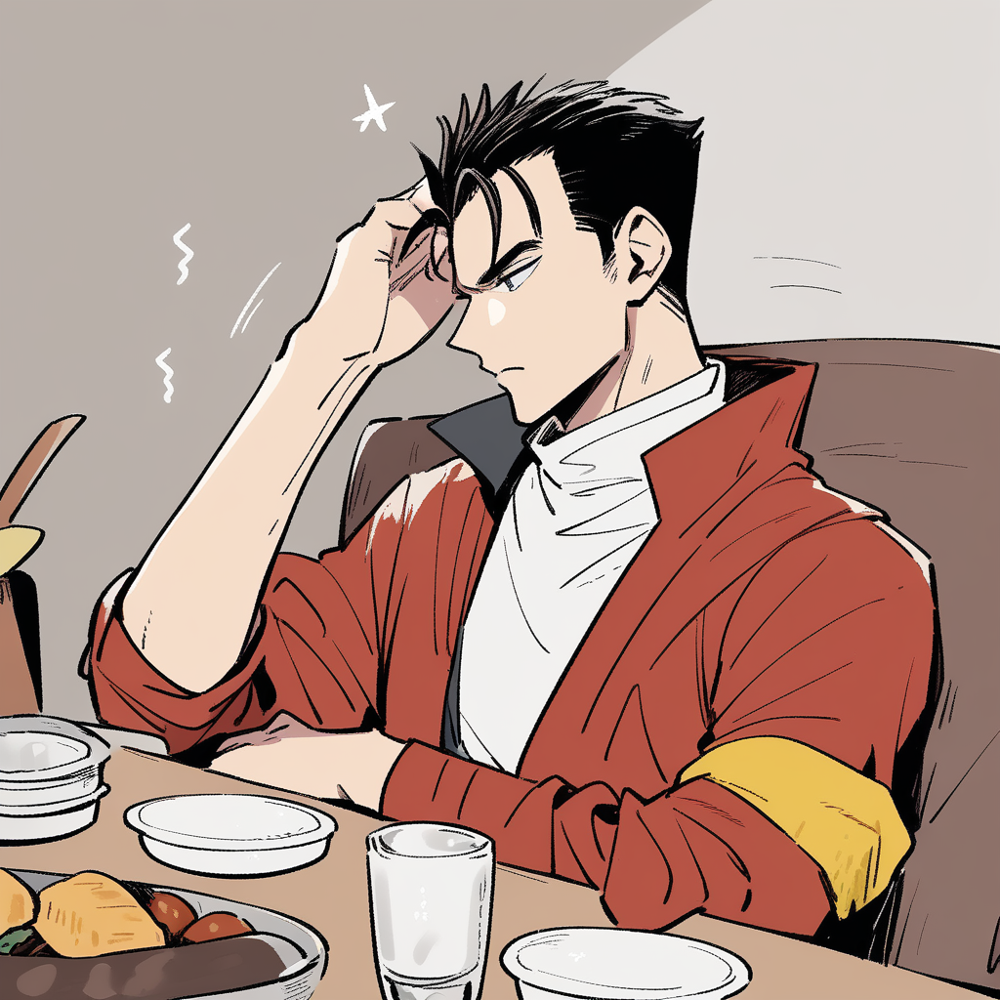

In [26]:
test_adv_model 

The above image is quite interesting as the input remains the original cow image.

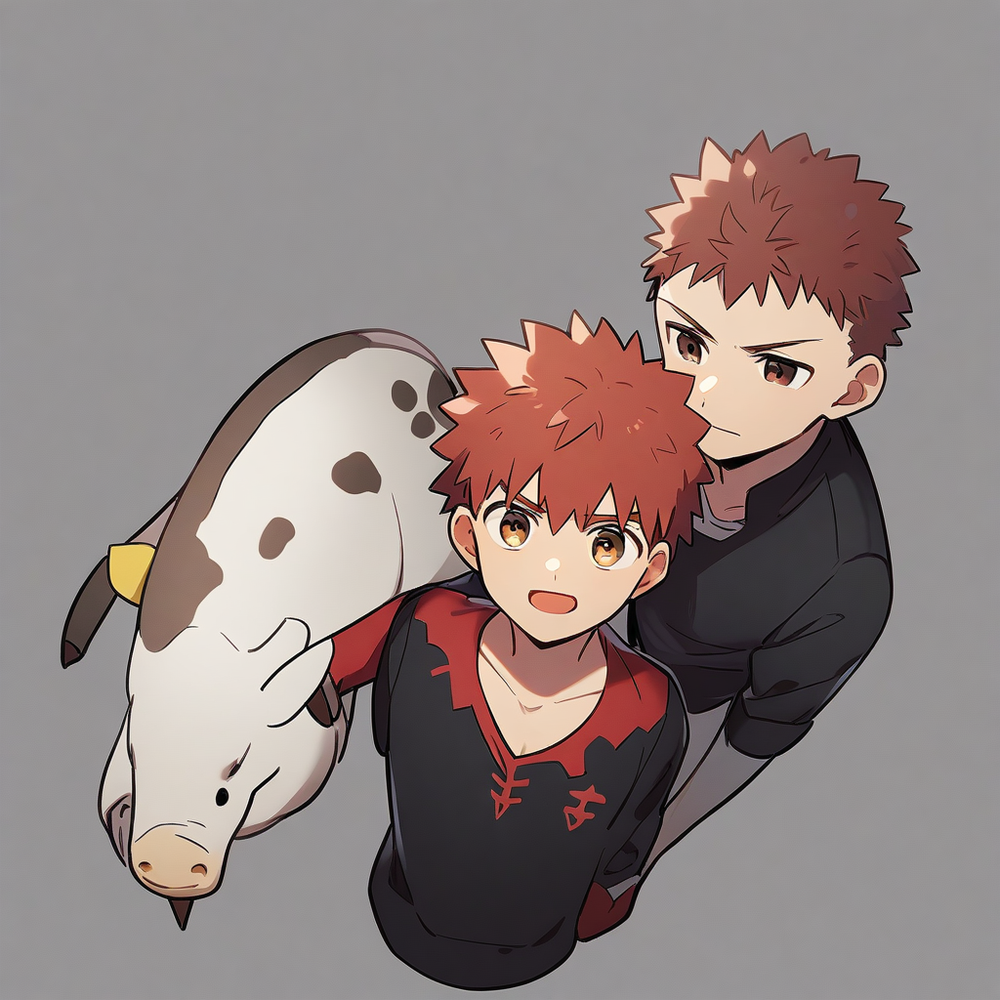

In [33]:
test_adv_model[0][0]

During testing I also ended up creating this image which has a cow bizzarely merging with the characters arm.

The nature of the animagine model is that it takes a specific character from a series and generates an image with it. As such it is probably best used for portraits or preexisting character mods. I will add the above certainly looks like the character I input so thats nice.

#### Anime2 style

In [31]:
anime2_test = image_generator('./bg-kuster_cow-001.jpg',  style='anime2', num_inference_steps=30,
                              max_length=50, predownloaded=True)
anime2_test

a brown cow with a yellow tag on its ear
Manually convert your initial prompt into booru tags.
A full list can be found at Danbooru or other boorus. NSFW Warning
Use your own discretion visiting this website. https://danbooru.donmai.us/
Initial prompt:  a brown cow with a yellow tag on its ear
 Your input: cow, masterpiece, quality, yellow earring


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

OSError: Error no file named diffusion_pytorch_model.bin found in directory ./models/waifu-diffusion\unet.

Different models may have different issues of how to load them to run. For example the folder unet does exist in this directory but it seems like the slashes may be getting called wrong causing the error we see above. This unfortuantely will have to be a matter of future development.

#### Realism style

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

C:\Users\dblan\anaconda3\lib\site-packages\transformers\models\clip\feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/30 [00:00<?, ?it/s]

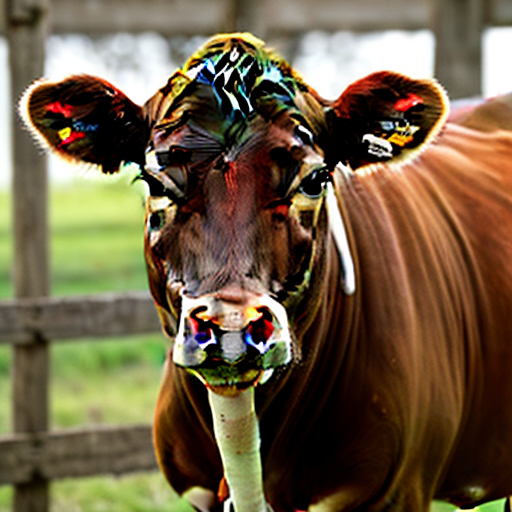

In [32]:
realism_test = image_generator('./bg-kuster_cow-001.jpg',  style='realism', num_inference_steps=30,
                              max_length=50, predownloaded=True)
realism_test

I suspect I will need to run the realism with more inference steps to achieve better results. But it did give me back something that looks correct!

#### Low Inference Steps

### Testing Call Function

In [33]:
filepath='./test/'

In [36]:
ghibli_list_test = generate_graphic_mods(filepath, save_folder='', style='ghibli', num_inference_steps=40, predownloaded=True)

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

style_model predown = True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

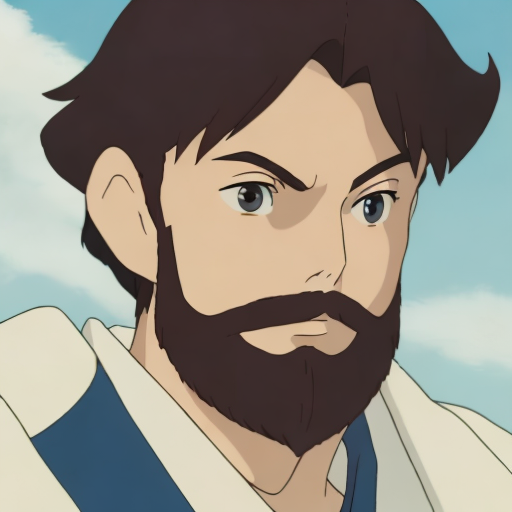

In [37]:
ghibli_list_test[0]

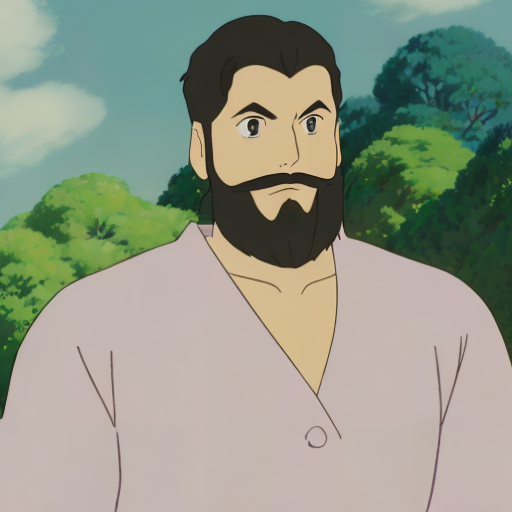

In [38]:
ghibli_list_test[1]

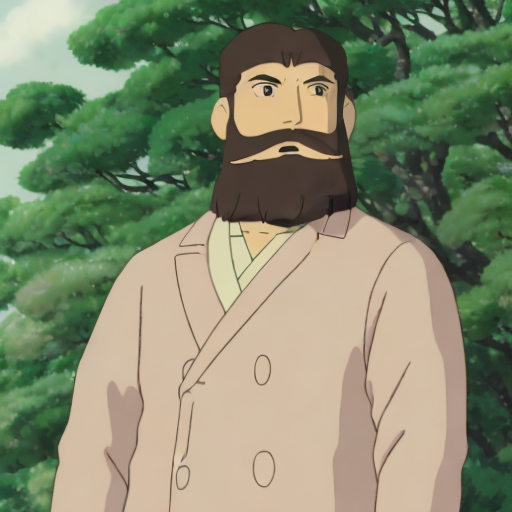

In [42]:
ghibli_list_test[2]

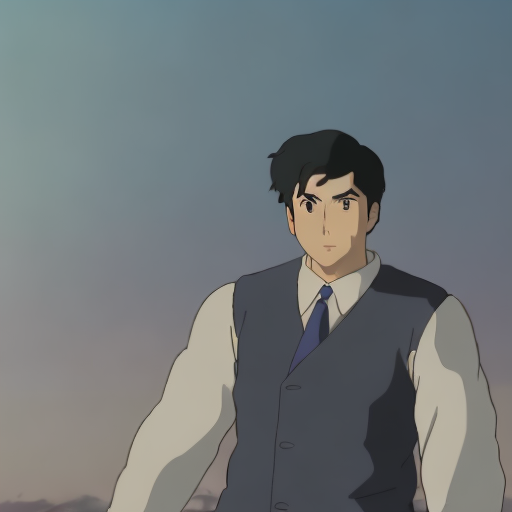

In [43]:
ghibli_list_test[3]

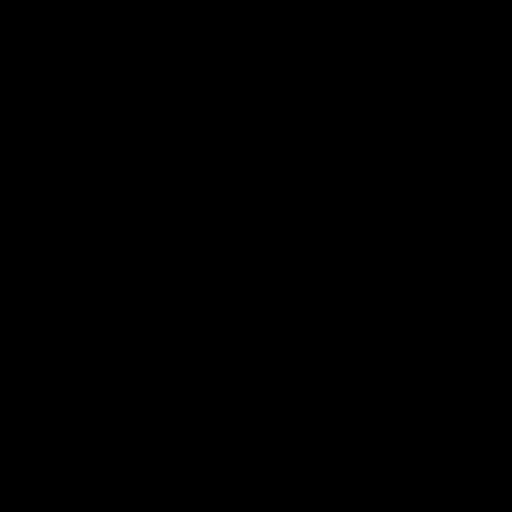

In [47]:
ghibli_list_test[8]

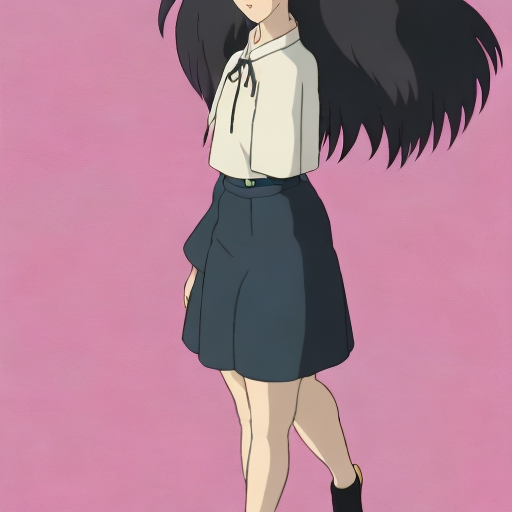

In [48]:
ghibli_list_test[16]

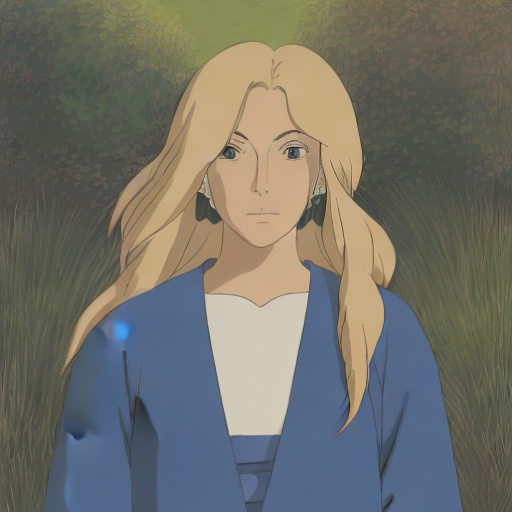

In [49]:
ghibli_list_test[19]

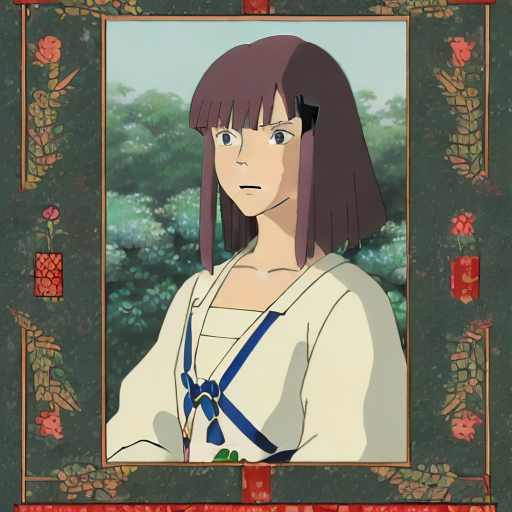

In [50]:
ghibli_list_test[22]

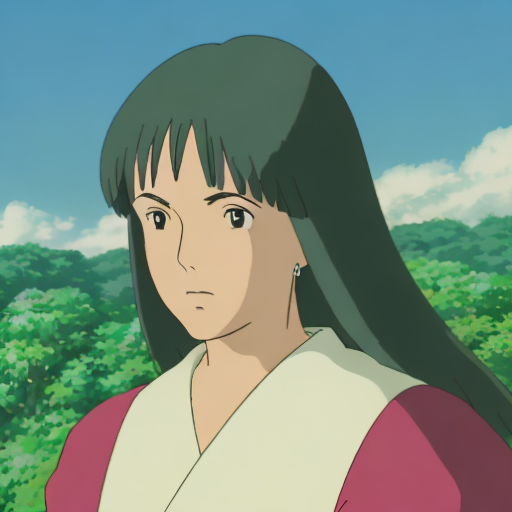

In [40]:
ghibli_list_test[-1]

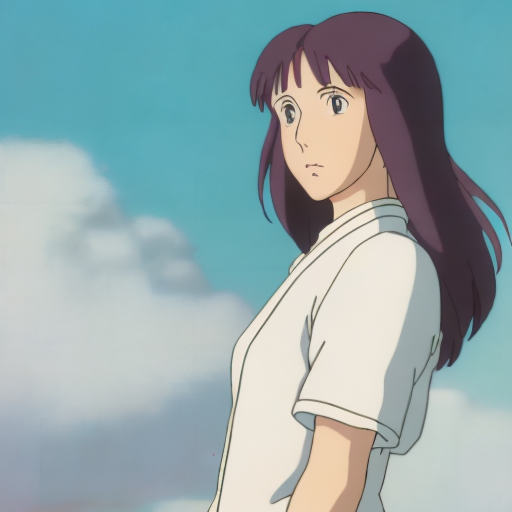

In [46]:
ghibli_list_test[-2]

In [39]:
ghibli_list_test

[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=51

These images were made from character portraits from the game ΔV: Rings of Saturn. I present a subset of the original images in my write up for a comparison.

In [3]:
prompt = prompt_generator('./test/050.png', predownloaded=True)
print(prompt)

an older man with white hair and a white shirt


In [4]:
prompt = prompt_generator('./test/070.png', predownloaded=True)
print(prompt)

a man in a gray shirt smiling at the camera


In [5]:
prompt = prompt_generator('./test/210.png', predownloaded=True)
print(prompt)

a painting of a woman with long blonde hair
